# Single Family Parcels in the City of Los Angeles

### By Sharon Ghalchi

For our group project, my team is researching the potential impact that SB8, SB9, and SB10 can make on the supply of affordable housing in the City of Los Angeles. One of our primary data sources will highlight existing single-famiy zoning conditions in the City of Los. This data source will highlight areas in which ADUs and smallplexes are permitted to be constructed. The zoning information for the City of Los Angeles can be found [here](https://geohub.lacity.org/datasets/zoning/explore?location=34.055956%2C-118.234564%2C12.90).

Thus, in this notebook, I will be filtering the zoning information of the City of Los Angeles to visualize single family zones. This data will help us understand 



zones in the City of Los Angeles to identify the distribution of single family zoning in the  in which affordable ADUs and smallplexes could potentially be built to. Once I have filtered through the data, I will map my findings. I have already reduced the data size of the original geojson file on `mapshaper.org` since it was much too large. 

## 1. Importing Data

In [1]:
# for general data wrangling tasks
import pandas as pd

# to read and visualize spatial data
import geopandas as gpd

# to provide basemaps 
import contextily as ctx

# to give more power to your figures (plots)
import matplotlib.pyplot as plt

# for interactive plots
import plotly.express as px

In [2]:
#lets import our data
gdf = gpd.read_file('Data/LA_Zoning.json')

## 2. Preliminary Exploration

I want to get an idea of what my data looks like. We will look at shape to see the number of rows and columns available to us, type to make sure mapshaper did not convert our geopanda file into something else, and head to get a better look at what data is available to us.

In [3]:
#number of rows and columns 
gdf.shape

(58663, 7)

We have 58663 rows and 7 columms. 

In [4]:
# double checking to make sure mapshaper did not change the data type
type(gdf)

geopandas.geodataframe.GeoDataFrame

Geopandas! We're good to go. 

In [5]:
# what does my data table look like?
gdf.head()

,OBJECTID,ZONE_CMPLT,ZONE_CLASS,ZONE_SMRY,SHAPE_Length,SHAPE_Area,geometry
0,1,(F)CM-1-CUGU,CM,INDUSTRIAL,0.001376,1.135955e-07,"POLYGON ((-118.38794 34.22863, -118.38794 34.2..."
1,2,(F)CM-1-CUGU,CM,INDUSTRIAL,0.001376,1.136063e-07,"POLYGON ((-118.38794 34.22959, -118.38795 34.2..."
2,3,(F)CM-1-CUGU,CM,INDUSTRIAL,0.001102,5.680651e-08,"POLYGON ((-118.38795 34.23014, -118.38795 34.2..."
3,4,(F)CM-1-CUGU,CM,INDUSTRIAL,0.001102,5.680455e-08,"POLYGON ((-118.38795 34.23041, -118.38795 34.2..."
4,5,(F)CM-1-CUGU,CM,INDUSTRIAL,0.001376,1.136150e-07,"POLYGON ((-118.38795 34.23140, -118.38796 34.2..."


Okay it looks like we have an object ID column followed by three different categorization categories, two shape/float columns, and a geometry/location column. 

In [6]:
# here is a summary of the information we just looked at
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 58663 entries, 0 to 58662
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   OBJECTID      58663 non-null  int64   
 1   ZONE_CMPLT    58663 non-null  object  
 2   ZONE_CLASS    58663 non-null  object  
 3   ZONE_SMRY     58537 non-null  object  
 4   SHAPE_Length  58663 non-null  float64 
 5   SHAPE_Area    58663 non-null  float64 
 6   geometry      58663 non-null  geometry
dtypes: float64(2), geometry(1), int64(1), object(3)
memory usage: 3.1+ MB


Now that we know what our data looks like, we can start analyzing our data

## 3. Data Values

I want to look at the value options/counts in our object columns.

### Zoning Summary 

In [7]:
gdf['ZONE_SMRY'].value_counts()

RESIDENTIAL        36534
COMMERCIAL         11095
INDUSTRIAL          3663
AGRICULTURE         2445
PUBLIC FACILITY     2100
OPEN SPACE          1451
PARKING             1249
Name: ZONE_SMRY, dtype: int64

Okay, so this column let's me know what land use type each zone has. I know that I want to look at the residential zones, so this could be useful.

### Zone Class

In the LA, the zone class is defined as: *the types of uses that are permitted on a property, including regulations related to building setbacks and minimum lot size requirements.* Let's take a look at the zone classes in this data set.

In [8]:
gdf['ZONE_CLASS'].value_counts()

R1        12768
C2         8023
R3         5045
RD1.5      3370
R2         3329
          ...  
PVSP          1
M2(PV)        1
USC-1A        1
CCS           1
A2P           1
Name: ZONE_CLASS, Length: 111, dtype: int64

Now this column tells me the actual zoning classification of the parcel. Downside, there are 111 unique values in this column. Upside, I only need the single family zone classes, so I won't really need to look into all 111 unique classifications. However, I might want to look at all the different classifications within the residential land use parcels.

### Zoning Code

By looking at the data table generated above, I can tell that the `ZONE_CMPLT` is giving us the complete zoning code for zone. The complete code gives us extra information like how tall a building on a property can be or if the parcel fall in a planning overlay districts. Let's take a look at how many unique values we have. 

In [9]:
gdf['ZONE_CMPLT'].value_counts()

R1-1           7914
RS-1           2442
R3-1           2383
R2-1           1713
C2-1VL-CPIO    1377
               ... 
[Q]A2-1           1
R1-1-K-RFA        1
(T)RS-1-K         1
(Q)RD4-1XL        1
A2P-1             1
Name: ZONE_CMPLT, Length: 1941, dtype: int64

There are 1941 unique values which is a lot. For the purposes of our research, we don't really need to know the entire zoning code of each parcel. All we need to know is the actual zone class. Thus, I can somewhat ignore this column. I won't delete it just yet because I may find use for it in the future.  

## 4. Filtering Data

### Residential Land Use 

I want to start off by filtering for the residential land use parcels only. This will help me trim the number of zone classes I can use.

In [10]:
gdf.query("ZONE_SMRY == 'RESIDENTIAL'")

,OBJECTID,ZONE_CMPLT,ZONE_CLASS,ZONE_SMRY,SHAPE_Length,SHAPE_Area,geometry
10,11,(F)R2-1-RIO,R2,RESIDENTIAL,0.003084,5.452941e-07,"POLYGON ((-118.48039 34.19086, -118.47940 34.1..."
11,12,(F)R2-1-RIO,R2,RESIDENTIAL,0.002809,3.635111e-07,"POLYGON ((-118.47939 34.19182, -118.47940 34.1..."
12,13,(F)R2-1-RIO,R2,RESIDENTIAL,0.003358,6.816327e-07,"POLYGON ((-118.47940 34.19265, -118.47940 34.1..."
13,14,(F)RE11-1,RE11,RESIDENTIAL,0.002197,2.039770e-07,"POLYGON ((-118.46579 34.32016, -118.46516 34.3..."
14,15,(F)RE11-1,RE11,RESIDENTIAL,0.002240,2.223388e-07,"POLYGON ((-118.46643 34.32065, -118.46579 34.3..."
...,...,...,...,...,...,...,...
58575,58576,[Q]R1-1D,R1,RESIDENTIAL,0.011773,2.462393e-06,"POLYGON ((-118.19818 34.07555, -118.19818 34.0..."
58576,58577,R1-1,R1,RESIDENTIAL,0.007004,1.775233e-06,"POLYGON ((-118.44049 34.20476, -118.44110 34.2..."
58581,58582,(T)R1-1,R1,RESIDENTIAL,0.002036,2.272604e-07,"POLYGON ((-118.52513 34.22788, -118.52513 34.2..."
58582,58583,(T)(Q)RD3-1,RD3,RESIDENTIAL,0.002211,2.155164e-07,"POLYGON ((-118.45261 34.23747, -118.45261 34.2..."


Now we have all the residential zones. This reduced our dataset from 58663 to 36534 rows. 

Let's define this query as *residential*

In [11]:
residential = gdf.query("ZONE_SMRY == 'RESIDENTIAL'").copy()
residential

,OBJECTID,ZONE_CMPLT,ZONE_CLASS,ZONE_SMRY,SHAPE_Length,SHAPE_Area,geometry
10,11,(F)R2-1-RIO,R2,RESIDENTIAL,0.003084,5.452941e-07,"POLYGON ((-118.48039 34.19086, -118.47940 34.1..."
11,12,(F)R2-1-RIO,R2,RESIDENTIAL,0.002809,3.635111e-07,"POLYGON ((-118.47939 34.19182, -118.47940 34.1..."
12,13,(F)R2-1-RIO,R2,RESIDENTIAL,0.003358,6.816327e-07,"POLYGON ((-118.47940 34.19265, -118.47940 34.1..."
13,14,(F)RE11-1,RE11,RESIDENTIAL,0.002197,2.039770e-07,"POLYGON ((-118.46579 34.32016, -118.46516 34.3..."
14,15,(F)RE11-1,RE11,RESIDENTIAL,0.002240,2.223388e-07,"POLYGON ((-118.46643 34.32065, -118.46579 34.3..."
...,...,...,...,...,...,...,...
58575,58576,[Q]R1-1D,R1,RESIDENTIAL,0.011773,2.462393e-06,"POLYGON ((-118.19818 34.07555, -118.19818 34.0..."
58576,58577,R1-1,R1,RESIDENTIAL,0.007004,1.775233e-06,"POLYGON ((-118.44049 34.20476, -118.44110 34.2..."
58581,58582,(T)R1-1,R1,RESIDENTIAL,0.002036,2.272604e-07,"POLYGON ((-118.52513 34.22788, -118.52513 34.2..."
58582,58583,(T)(Q)RD3-1,RD3,RESIDENTIAL,0.002211,2.155164e-07,"POLYGON ((-118.45261 34.23747, -118.45261 34.2..."


Now that I have filtered for residential land use, I can take a look at the residential zone classes to find the ones that apply to single family residential lots. 

In [12]:
residential['ZONE_CLASS'].value_counts()

R1          12768
R3           5045
RD1.5        3370
R2           3329
RS           2851
RD2          2079
R4           1265
RE11         1217
R1V2          824
RE15          760
RD3           702
RE40          417
RE9           304
RE20          278
R1R3          245
R5            140
RAS4          139
RD6           119
R1V3          116
RD5            92
R1V1           69
RD4            67
R1H1           47
RAS3           44
RW1            36
RMP            35
R3P            24
R4P            22
R1P            20
R4(PV)         20
RAS3(UV)       16
RZ3            12
R5P            11
RW2            10
RZ4             7
RZ5             7
R3(PV)          6
R3(UV)          6
RE              5
RZ2.5           5
R2P             2
RU              2
RSP             1
Name: ZONE_CLASS, dtype: int64

Now I can see exactly what the different zone class options for residntial land uses are. The single family zone classifications with the sufficient minimum rear yard setback requirement to build an ADU are: R1, RS, RU, R1V1, R1V2, RIV3, R1P, R1R3, R1H1, R1P, RW1, RE9, RE11, RE15, RE20, RE40. ([source](https://planning.lacity.org/odocument/eadcb225-a16b-4ce6-bc94-c915408c2b04/Zoning_Code_Summary.pdf)). I double checked our zone class values listed above to make sure the the codes match. They do! Thus, I want to filter my data for those parcels.


### Filtering for Single Family Zones

In [13]:
# I want to define a list of my filtered categories
filter_list = ['R1', 'RS', 'RU', 'R1V1', 'R1V2', 'RIV3', 'R1P', 'R1R3', 'R1H1', 'RW1', 'RE9', 'RE11', 'RE15', 'RE20', 'RE40']

In [14]:
#Now I filter my data for single family residential zones using my filtered zone classes.
gdf[gdf.ZONE_CLASS.isin(filter_list)]

,OBJECTID,ZONE_CMPLT,ZONE_CLASS,ZONE_SMRY,SHAPE_Length,SHAPE_Area,geometry
13,14,(F)RE11-1,RE11,RESIDENTIAL,0.002197,2.039770e-07,"POLYGON ((-118.46579 34.32016, -118.46516 34.3..."
14,15,(F)RE11-1,RE11,RESIDENTIAL,0.002240,2.223388e-07,"POLYGON ((-118.46643 34.32065, -118.46579 34.3..."
292,293,R1-1,R1,RESIDENTIAL,0.002181,2.471552e-07,"POLYGON ((-118.55781 34.20746, -118.55750 34.2..."
293,294,(Q)R1-1,R1,RESIDENTIAL,0.004872,6.329446e-07,"POLYGON ((-118.58963 34.22095, -118.58963 34.2..."
294,295,(Q)R1-1,R1,RESIDENTIAL,0.004019,3.750881e-07,"POLYGON ((-118.48842 34.22792, -118.48889 34.2..."
...,...,...,...,...,...,...,...
58572,58573,R1-1-CUGU,R1,RESIDENTIAL,0.002523,3.548346e-07,"POLYGON ((-118.36989 34.23047, -118.36924 34.2..."
58574,58575,[Q]RE20-1D,RE20,RESIDENTIAL,0.001126,2.483553e-08,"POLYGON ((-118.19818 34.07555, -118.19811 34.0..."
58575,58576,[Q]R1-1D,R1,RESIDENTIAL,0.011773,2.462393e-06,"POLYGON ((-118.19818 34.07555, -118.19818 34.0..."
58576,58577,R1-1,R1,RESIDENTIAL,0.007004,1.775233e-06,"POLYGON ((-118.44049 34.20476, -118.44110 34.2..."


We now have 19,843 rows which means we have 19,843 single family zones. However, each of these zones actually has multiple parcels on them. Unfortunately, this data does not give us the count of parcels within each zone. We will look into the parcel data for the final.

I'm going to define this list so that we can easily analyze and visualize only our single family zones.

In [15]:
#Define this list
single_family = gdf[gdf.ZONE_CLASS.isin(filter_list)].copy()
single_family

,OBJECTID,ZONE_CMPLT,ZONE_CLASS,ZONE_SMRY,SHAPE_Length,SHAPE_Area,geometry
13,14,(F)RE11-1,RE11,RESIDENTIAL,0.002197,2.039770e-07,"POLYGON ((-118.46579 34.32016, -118.46516 34.3..."
14,15,(F)RE11-1,RE11,RESIDENTIAL,0.002240,2.223388e-07,"POLYGON ((-118.46643 34.32065, -118.46579 34.3..."
292,293,R1-1,R1,RESIDENTIAL,0.002181,2.471552e-07,"POLYGON ((-118.55781 34.20746, -118.55750 34.2..."
293,294,(Q)R1-1,R1,RESIDENTIAL,0.004872,6.329446e-07,"POLYGON ((-118.58963 34.22095, -118.58963 34.2..."
294,295,(Q)R1-1,R1,RESIDENTIAL,0.004019,3.750881e-07,"POLYGON ((-118.48842 34.22792, -118.48889 34.2..."
...,...,...,...,...,...,...,...
58572,58573,R1-1-CUGU,R1,RESIDENTIAL,0.002523,3.548346e-07,"POLYGON ((-118.36989 34.23047, -118.36924 34.2..."
58574,58575,[Q]RE20-1D,RE20,RESIDENTIAL,0.001126,2.483553e-08,"POLYGON ((-118.19818 34.07555, -118.19811 34.0..."
58575,58576,[Q]R1-1D,R1,RESIDENTIAL,0.011773,2.462393e-06,"POLYGON ((-118.19818 34.07555, -118.19818 34.0..."
58576,58577,R1-1,R1,RESIDENTIAL,0.007004,1.775233e-06,"POLYGON ((-118.44049 34.20476, -118.44110 34.2..."


In [16]:
# Let's check distribution 
single_family['ZONE_CLASS'].value_counts()

R1      12768
RS       2851
RE11     1217
R1V2      824
RE15      760
RE40      417
RE9       304
RE20      278
R1R3      245
R1V1       69
R1H1       47
RW1        36
R1P        20
RU          2
Name: ZONE_CLASS, dtype: int64

Here we can see the number of zones we have with each zone class. It's interesting to see the type of single family zoning that is the most and the least prominant. We see that R1 and RS zones are our most prominant zones. R1 is known as traditional single family zoning, so it makes sense that R1 zones make up the majority of our data. RS is our suburban single family zoning. Historically, LA suburbs are known to have a higher rate of single family zoning than urban neighborhood, so again it makes sense that RS zones would be the second most prominant. Now our least prominant zone class is RU. RU is single family urban zones. We know that single family zoning is not very prominant. However, we did not expect that there would only be 2 RU zones in the entire city. 

## 5. Plot Data

Now that we have our value counts, we want to visualize our data. We visualize this data using both a regular bar plot and an interactive bar plot. You can see our process below. 

In [17]:
# Let's define our new value count
single_family_count = single_family['ZONE_CLASS'].value_counts()
single_family_count

R1      12768
RS       2851
RE11     1217
R1V2      824
RE15      760
RE40      417
RE9       304
RE20      278
R1R3      245
R1V1       69
R1H1       47
RW1        36
R1P        20
RU          2
Name: ZONE_CLASS, dtype: int64

In [18]:
# Let's convert the series into a dataframe so that I can easily plot it
single_family_count.reset_index()

,index,ZONE_CLASS
0,R1,12768
1,RS,2851
2,RE11,1217
3,R1V2,824
4,RE15,760
5,RE40,417
6,RE9,304
7,RE20,278
8,R1R3,245
9,R1V1,69


In [19]:
# Double check that it worked
type(single_family_count)

pandas.core.series.Series

In [20]:
# Redefine columns
single_family_count.columns = ['Zone_Class', 'Count']

In [21]:
single_family_count.columns

['Zone_Class', 'Count']

Text(0.5, 1.0, 'Number of Zones Per Single Family Zone Class')

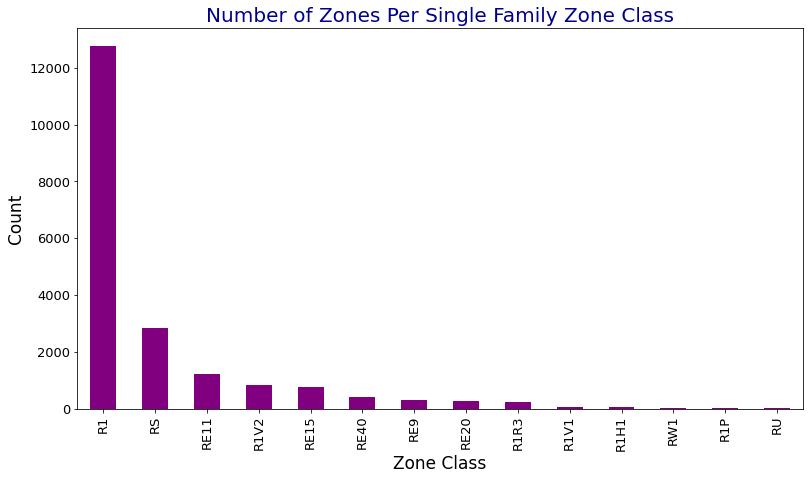

In [22]:
# Finally, let's plot!
single_family_count.plot.bar(figsize=(13,7), x = 'Zone_Class', fontsize = 13, y = 'Count', color = 'purple')

plt.xlabel('Zone Class', fontsize=17)
plt.ylabel('Count', fontsize=17)
plt.title('Number of Zones Per Single Family Zone Class', fontsize=20, color = 'darkblue')


In [23]:
# making an interactive bar chart with plotly
fig = px.bar(
        single_family_count,
         x = 'ZONE_CLASS', 
        title='Number of Zones per Single Family Zone Class',
        labels={
            'index':'Zone Class',
            'ZONE_CLASS':'Count'
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

Our regular bar plot is useful for reports while our interactive plot is useful for online reports. We already analyzed this data above. 

Now let's map our filtered data!

I want to start with every single single family zone class. 

<AxesSubplot:>

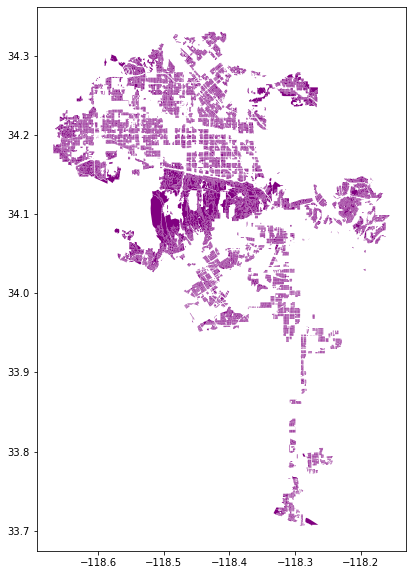

In [24]:
single_family.plot(figsize=(10,10), color = 'purple')

Now, I want to make each zone class a different color. 

<AxesSubplot:>

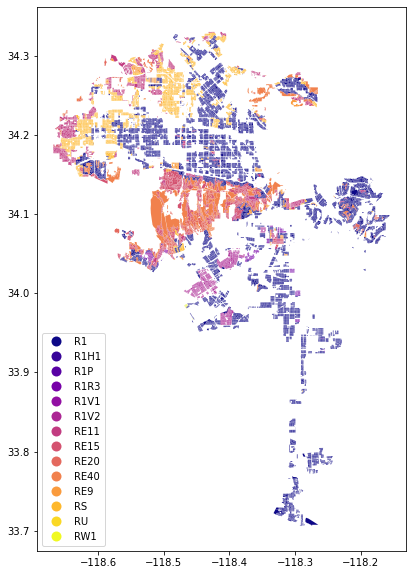

In [25]:
single_family.plot(
            figsize=(10,10),   #size of the plot (a bit bigger than the default)
            column = 'ZONE_CLASS',  #our zone class column 
            cmap = 'plasma', legend = True,     # add a legend           
            legend_kwds={
               'loc': 'lower left',
            }                 
) 


## 6. Mapping our Single Family Zones

Now we will map our data so that we can actually visualize the distribution of single family zoning throughout the city. It will be interesting to see which areas have a lot of single family zoning and which areas do not. 

We plot our data on a web basemap; however, before adding web map tiles to these plots, I need to ensure the coordinate reference systems (CRS) of the tiles and the data match. Web map tiles are typically provided in Web Mercator (EPSG 3857), so let us first check what CRS we are in.

Let's start with a map of all our single family zones.

In [26]:
single_family.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Now we know the CRS do not match, so we need to choose in which CRS we wish to visualize the data: either the CRS of the tiles, the one of the data, or even a different one.

The first option to match CRS is to leverage the `to_crs` method of GeoDataFrames to convert the CRS of our data, here to Web Mercator:

In [27]:
single_family_wm = single_family.to_crs(epsg=3857)

We can then use `add_basemap` function of contextily to easily add a background map to our plot:

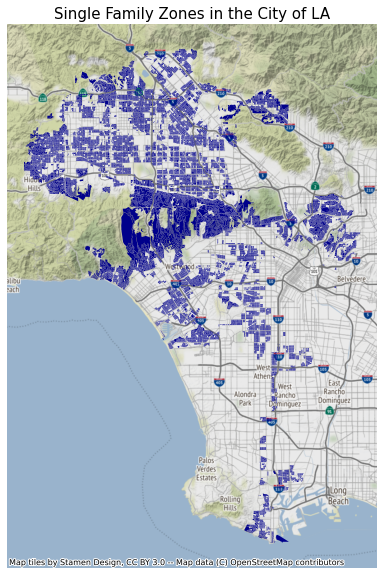

In [28]:
ax = single_family_wm.plot(figsize=(10,10), color = 'darkblue')
ax.set_title('Single Family Zones in the City of LA', fontsize=15)
ax.axis('off')
ctx.add_basemap(ax)

Well that definetly looks like an outline of LA. We can also see that single family zoning is concentrated in some areas an not so much in others. It will be interesting to overlay an outline of LA city boundaries so we can get a better idea of where single family zoning is more prominant than others. 

Now let's do our single family zone code map. This way we can also geet an idea of where each zone code is most prominant.

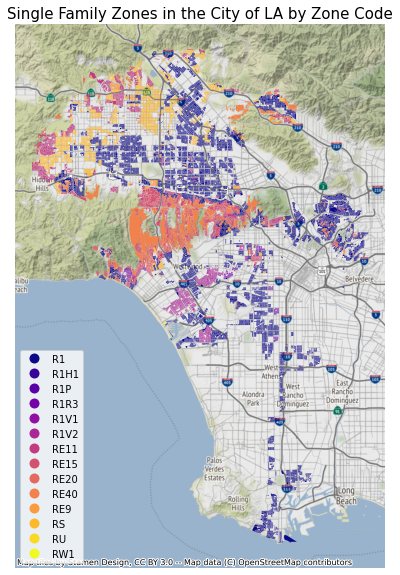

In [29]:
ax = single_family_wm.plot(
            figsize=(10,10),   
            column = 'ZONE_CLASS',  
            cmap = 'plasma', alpha = 1, legend = True,           
            legend_kwds={
               'loc': 'lower left',
            }        
) 
ax.axis('off')
ax.set_title('Single Family Zones in the City of LA by Zone Code', fontsize=15)
ctx.add_basemap(ax)

Okay, so we can clearly see that different zone codes are prominant in different areas. For example, R1 zoning, our traditional single family zoning, is dispersed throughout the city. It also looks like our various RE zones are located in our mountains. This makes sense since RE classifies single family estates zoning and estates in Los Angeles are known to be concentrated in the hills. 

We also see that although R1 zoning is dispersed throughout the City of LA, RS zoning is mostly found in the north east of the city. This makes sense since RS zoning is known as single family suburban zoning and the north west of the city is the suburbs. However, R1 is still also prominent here. It would be interesting to understand why the city needed to distinguish between R1 and RS zoning. Additionally, it would be interesting to see if there is more or less affordable housing where RS zoning is more prominant than R1 zoning. 

Although this map is great at summarizing our distribution, it is a little hard to see the smaller zones and zone classes. Thus, we use a function and a loop to map each zone class separately. 

## Step 7: Using a Function and Loop to Map Each Zone Class 

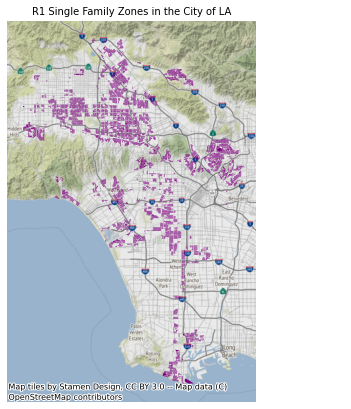

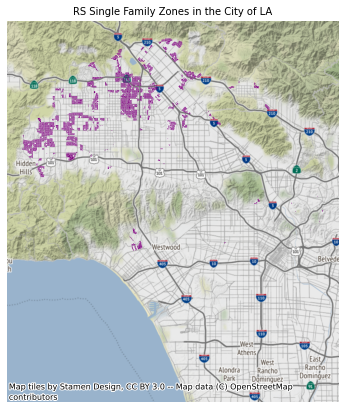

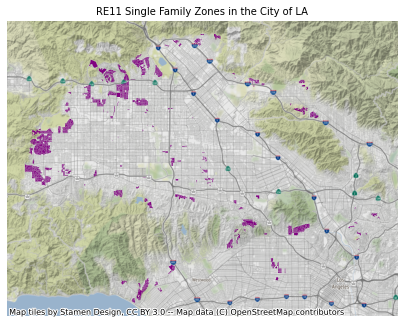

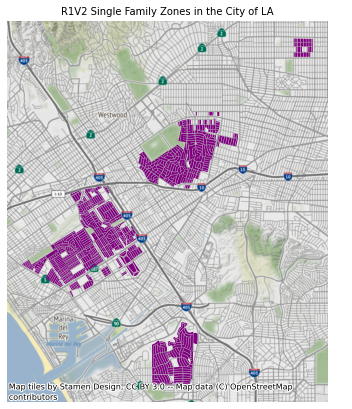

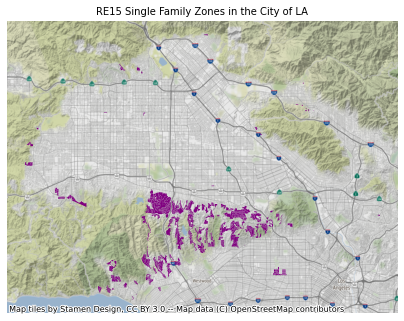

...

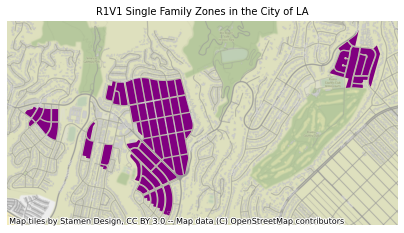

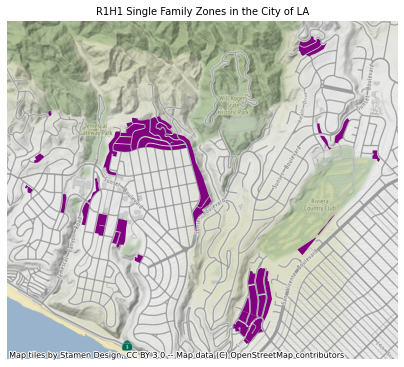

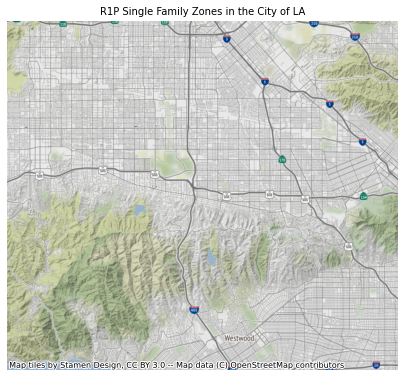

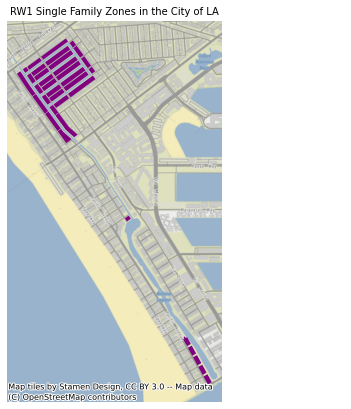

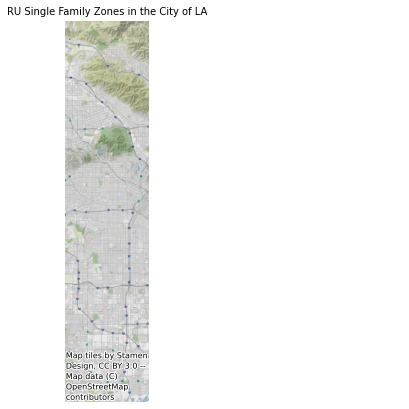

In [30]:
def make_zone_map(group='R1'):

    single_family_wm = single_family.to_crs(epsg=3857)

    ax = single_family_wm[single_family_wm['ZONE_CLASS'] == group].plot(figsize=(7,7), 
                                                                        color = 'purple')
    ax.set_title(group + ' Single Family Zones in the City of LA', fontsize=10)
    ax.axis('off')
    ctx.add_basemap(ax)
    
location_list = ['R1', 'RS', 'RE11', 'R1V2', 'RE15', 'RE40', 'RE9', 
                 'RE20', 'R1R3', 'R1V1', 'R1H1','R1P', 'RW1','RU']
# I listed the zones classes from highest number of zones to lowest.

for location in location_list:
   make_zone_map(group=location)

Looking at the distribution of each zone class separately, it seems that the only zone class that is truly distributed throughout the city is R1 zoning. We also see a pattern where as the number of zones in each zone class decreases the distribution of their locations throughout the city also decreases. For example, RW1, R1H1, and R1V1 zones all look like they are located in the same neighborhood while RS, R1, and RE11 zones are dispersed throughout a good chunk of the neighborhood. In general, zone classes tend to be clumbed near eachother. However, we do see two outliers: RU zones and R1P zones. There are only 2 RU zones and they are located at opposite ends of the city. Additionally R1P zones are so small and so vastly dispersed that we can barely see where they are located on the map. We would like to see if there are any correlations between affordability and type of single family zoning in the final.

There you have it folks, a look into the potential locations of new ADUs and smallplexes in the City of Los Angeles!

## Step 8 

I will now be exploring the la times neighborhood dataset from the smallplex notebook. 

In [31]:
Neighborhood_Boundaries = gpd.read_file('data/LA_Times_Neighborhood_Boundaries.zip')

In [32]:
Neighborhood_Boundaries.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 114 entries, 0 to 113
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   OBJECTID  114 non-null    int64   
 1   name      114 non-null    object  
 2   geometry  114 non-null    geometry
dtypes: geometry(1), int64(1), object(1)
memory usage: 2.8+ KB


In [33]:
Neighborhood_Boundaries.sample(5)

,OBJECTID,name,geometry
58,59,Manchester Square,"POLYGON ((-118.31774 33.97459, -118.31118 33.9..."
78,79,Reseda,"POLYGON ((-118.55822 34.18657, -118.56223 34.1..."
27,28,El Sereno,"POLYGON ((-118.17801 34.09873, -118.17801 34.0..."
62,63,Mission Hills,"POLYGON ((-118.46788 34.28986, -118.46774 34.2..."
35,36,Gramercy Park,"POLYGON ((-118.30041 33.95002, -118.30073 33.9..."


In [34]:
columns_to_keep_2 = ['name',
                     'geometry']

In [35]:
Neighborhood_Boundaries = Neighborhood_Boundaries[columns_to_keep_2]

In [36]:
Neighborhood_Boundaries.sample(5)

,name,geometry
106,Westlake,"POLYGON ((-118.25908 34.05389, -118.25984 34.0..."
38,Griffith Park,"POLYGON ((-118.30019 34.15791, -118.29884 34.1..."
57,Los Feliz,"POLYGON ((-118.27322 34.11841, -118.27177 34.1..."
36,Granada Hills,"POLYGON ((-118.48954 34.31469, -118.48576 34.3..."
74,Playa del Rey,"POLYGON ((-118.42735 33.96756, -118.42657 33.9..."


<AxesSubplot:>

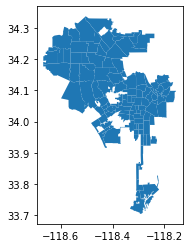

In [37]:
Neighborhood_Boundaries.plot()

In [38]:
Neighborhood_Boundaries = Neighborhood_Boundaries.to_crs(epsg=3857)

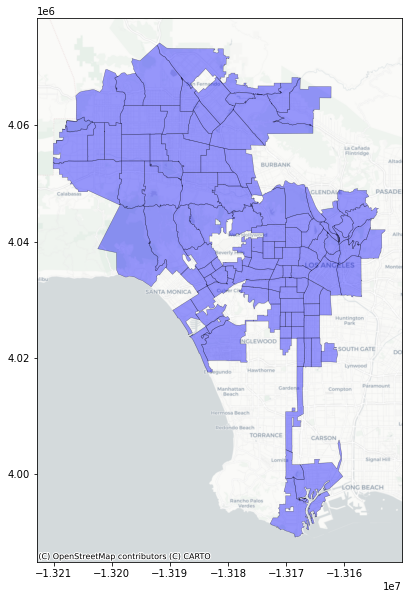

In [39]:
fig, ax = plt.subplots(figsize=(10,10))

Neighborhood_Boundaries.plot(ax=ax,
         color='blue', 
         edgecolor='black',
         lw=0.5,
         alpha=0.4)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

## Step 9 

I then overlayed zoning data on top of the neighborhood dataset

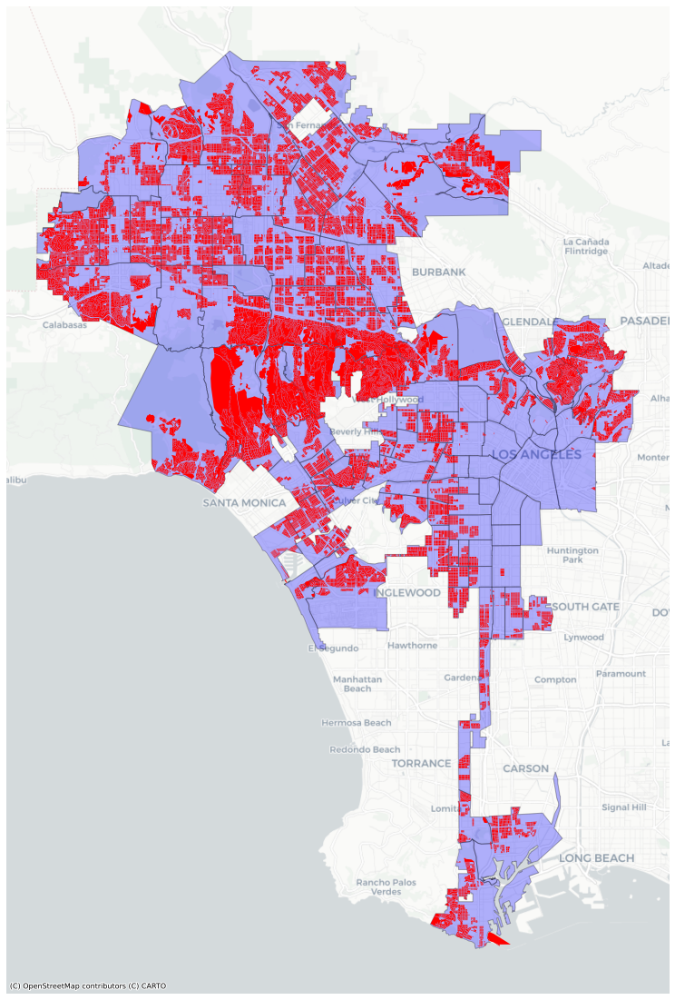

In [40]:
fig, ax = plt.subplots(figsize=(20, 20))

Neighborhood_Boundaries.plot(ax=ax,
        color='blue', 
        edgecolor='black',
        alpha=0.3)

single_family_wm.plot(ax=ax,
            color='red',
            markersize=10,
            alpha=1)


ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [41]:
Combined_Data = gpd.sjoin(single_family_wm, Neighborhood_Boundaries,how='left')

Combined_Data.head(3)

,OBJECTID,ZONE_CMPLT,ZONE_CLASS,ZONE_SMRY,SHAPE_Length,SHAPE_Area,geometry,index_right,name
13,14,(F)RE11-1,RE11,RESIDENTIAL,0.002197,2.039770e-07,"POLYGON ((-13187551.946 4071873.482, -13187480...",89.0,Sylmar
14,15,(F)RE11-1,RE11,RESIDENTIAL,0.002240,2.223388e-07,"POLYGON ((-13187622.185 4071939.156, -13187551...",89.0,Sylmar
292,293,R1-1,R1,RESIDENTIAL,0.002181,2.471552e-07,"POLYGON ((-13197795.161 4056692.414, -13197760...",78.0,Reseda


## Step 10 

I then identified which neighborhoods had the most single family zones

In [42]:
Zones_By_Neighborhood = Combined_Data.name.value_counts().rename_axis('name').reset_index(name='single family zones')

In [43]:
Zones_By_Neighborhood

,name,single family zones
0,Granada Hills,669
1,Woodland Hills,617
2,Sherman Oaks,572
3,Sylmar,553
4,Reseda,550
...,...,...
102,Chatsworth Reservoir,5
103,Sepulveda Basin,5
104,East Hollywood,3
105,Westlake,3


In [44]:
Neighborhood_Boundaries=Neighborhood_Boundaries.merge(Zones_By_Neighborhood,on='name')

In [45]:
Neighborhood_Boundaries.sample(10)

,name,geometry,single family zones
50,Larchmont,"POLYGON ((-13170609.839 4039043.151, -13171392...",24
49,Lake View Terrace,"POLYGON ((-13178825.778 4068918.733, -13178825...",120
20,Del Rey,"POLYGON ((-13181312.332 4028876.314, -13181302...",189
58,Mission Hills,"POLYGON ((-13187783.548 4067790.388, -13187768...",240
80,Studio City,"POLYGON ((-13180609.338 4049853.433, -13180534...",356
25,Elysian Park,"POLYGON ((-13162690.236 4041418.538, -13162480...",10
84,Tarzana,"POLYGON ((-13194397.150 4051763.163, -13194392...",201
16,Chatsworth Reservoir,"POLYGON ((-13204740.291 4060916.436, -13204685...",5
48,Koreatown,"POLYGON ((-13167743.362 4037105.812, -13167741...",59
93,Vermont Square,"POLYGON ((-13166994.404 4030291.085, -13167003...",200


## Step 11 

I then mapped the 20 neighborhoods with the most single family zones and the 20 neighborhoods with the least.

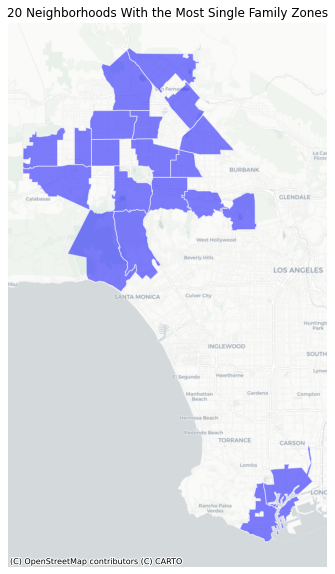

In [46]:
fig,ax = plt.subplots(figsize=(12,10))
Neighborhood_Boundaries.sort_values(by='single family zones',ascending=False)[:20].plot(ax=ax,
                                                                 color='blue',
                                                                 edgecolor='white',
                                                                 alpha=0.5,legend=True)


# title
ax.set_title('20 Neighborhoods With the Most Single Family Zones')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

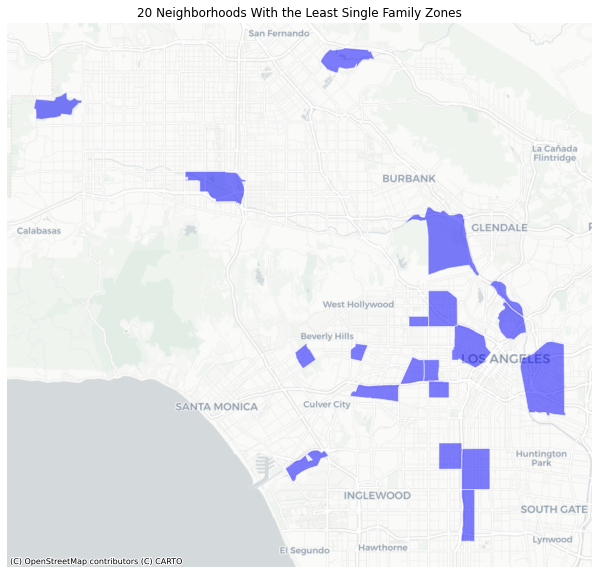

In [47]:
fig,ax = plt.subplots(figsize=(12,10))
Neighborhood_Boundaries.sort_values(by='single family zones',ascending=True)[:20].plot(ax=ax,
                                                                 color='blue',
                                                                 edgecolor='white',
                                                                 alpha=0.5,legend=True)


# title
ax.set_title('20 Neighborhoods With the Least Single Family Zones')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

## Step 12

I then did a chloropleth map to show the relationship that neighborhoods with large numbers of single family zones have with neighborhoods with small numbers of single family zones.

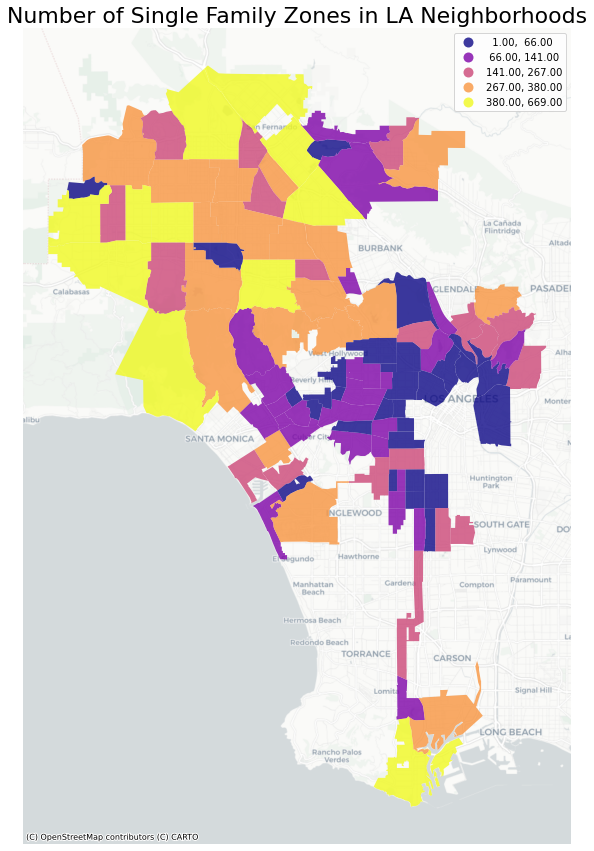

In [48]:
fig,ax = plt.subplots(figsize=(15,15))

Neighborhood_Boundaries.plot(ax=ax,
        column='single family zones',
        legend=True,
        alpha=0.8,
        cmap='plasma',
        scheme='natural_breaks')

ax.axis('off')
ax.set_title('Number of Single Family Zones in LA Neighborhoods',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

As expected we see the highest number of single family zones in suburban LA and the lowest number of single family zones in urban LA. For the final, we will overlay this data with affordability indicators. 